## VISION TRANSFORMER [ViT]

> **Transformer** which are the ***foundational models*** for the new Generative Large Language Models, are originally designed to understand sequential and spatial relationships in text data. This revolutionary architecture is also shifted to process the images, which in some cases overlaps the Convolutional Neural Networks. 

> **Vision Transformer** is a model for *Image Classification*. An image is split into fixed-size patches, each of them are then linearly embedded, position embeddings are added, and the resulting sequence of vectors is fed to a standard Transformer encoder. In order to perform classification, the standard approach of adding an extra learnable “classification token” to the sequence is used.

![Vit Stack](./Others/a90d08af64454e0d8b40c7d08108f324.gif)

> One of the key distinctions between ViTs and CNNs lies in their approach to feature extraction. CNNs, with their convolutional layers, perform a computation-intensive task of extracting local features from images. ViTs, on the other hand, adopt a more innovative strategy. ViTs are capable of grasping global information within images, transcending the limitations of local feature extraction.

    This notebook uses only Training data in order to learn functionality of ViT and attention mechanism on images.

### 1. Creation of Dataset

In [1]:
"""Import Packages"""

import os
import torch
import torch.nn as nn
from torchvision import transforms as T
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchview import draw_graph # Ref and credits: https://github.com/mert-kurttutan/torchview for visualizing model graph.
from torchsummary import summary
from vit_module import ViT
from tqdm.notebook import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import cv2
%matplotlib inline

In [2]:
"""Images Directory"""
# Dataset Ref: https://www.kaggle.com/datasets/alessiocorrado99/animals10

Root_Directory = './Animals/raw-img'
Images = []
for l in os.listdir(Root_Directory):
    if os.path.isdir(os.path.join(Root_Directory, ''.join(l))):
        Directory = os.path.join(Root_Directory, ''.join(l))
        Images += os.listdir(Directory)
len(Images)

26180

In [3]:
"""Model Configuration"""

image_size = (176, 176)
patch_size = 16
in_channels = 3
num_patches = (image_size[0] * image_size[1]) // (patch_size ** 2)
emb_dim = (patch_size ** 2) * in_channels
stats = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
batch_size = 64
lr = 1e-4
num_patches, emb_dim

(121, 768)

In [4]:
"""Image Transformation"""

train_transform = T.Compose([
                             T.Resize(image_size),
                             T.RandomRotation(0.5), 
                             T.RandomHorizontalFlip(0.1),
                             T.RandomVerticalFlip(0.1),
                             T.ToTensor(),
                             T.Normalize(*stats)
                            ])

inf_transform = T.Compose([
                           T.Resize(image_size), 
                           T.ToTensor(),
                           T.Normalize(*stats)
                          ])

In [5]:
"""Creating Dataset using Image Folder"""
Dataset_train = ImageFolder(root = Root_Directory, transform = train_transform)
print(Dataset_train.class_to_idx)

{'cane': 0, 'cavallo': 1, 'elefante': 2, 'farfalla': 3, 'gallina': 4, 'gatto': 5, 'mucca': 6, 'pecora': 7, 'ragno': 8, 'scoiattolo': 9}


In [6]:
# Ref: https://www.kaggle.com/datasets/alessiocorrado99/animals10
translate = {"cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly", "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep", "ragno": "spider", "scoiattolo": "squirrel"}

In [7]:
for key, value in translate.items():
    Dataset_train.class_to_idx[value] = Dataset_train.class_to_idx[key]
    del(Dataset_train.class_to_idx[key])
Dataset_train.class_to_idx

{'dog': 0,
 'horse': 1,
 'elephant': 2,
 'butterfly': 3,
 'chicken': 4,
 'cat': 5,
 'cow': 6,
 'sheep': 7,
 'spider': 8,
 'squirrel': 9}

In [8]:
num_class = len(Dataset_train.classes)
num_class

10

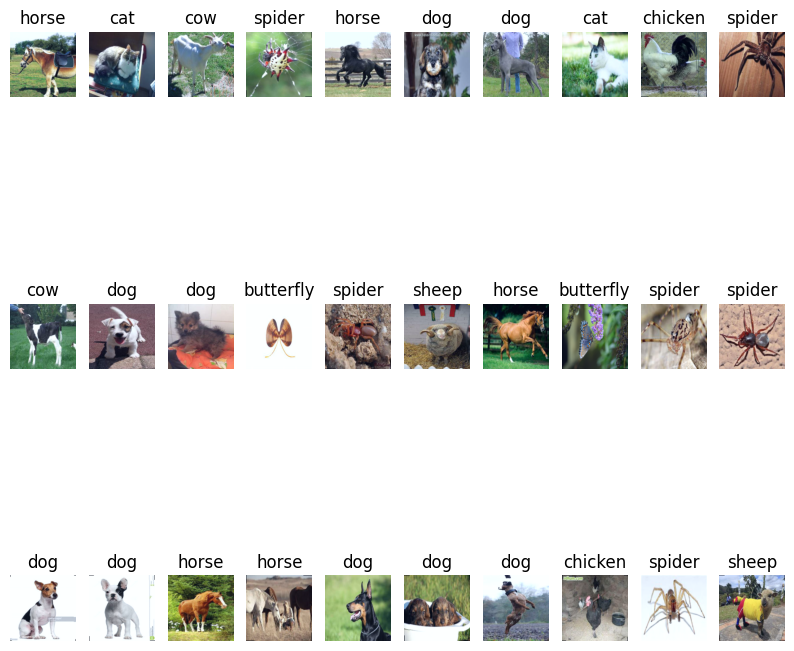

In [11]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

figure = plt.figure(figsize=(10, 10))
cols, rows = 10, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(Dataset_train), size=(1,)).item()
    img, label = Dataset_train[sample_idx]
    img = img.detach().cpu()
    img = denorm(img).permute(1, 2, 0)
    img = torch.clamp(img, 0, 1)
    figure.add_subplot(rows, cols, i)
    plt.title(list(Dataset_train.class_to_idx.keys())[list(Dataset_train.class_to_idx.values()).index(label)])
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")
plt.show()

In [12]:
Train_Dl = DataLoader(Dataset_train, batch_size, num_workers = 4, shuffle = True, pin_memory = True)

In [13]:
def get_default_device():
    """Use GPU if available, else CPU"""
    if torch.cuda.is_available():
        for i in range(torch.cuda.device_count()):
            print(torch.cuda.get_device_properties(i))
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move Tensors to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a Dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [14]:
device = get_default_device()

_CudaDeviceProperties(name='NVIDIA GeForce RTX 3060 Laptop GPU', major=8, minor=6, total_memory=6143MB, multi_processor_count=30)


In [15]:
Train_Dl = DeviceDataLoader(Train_Dl, device)

In [16]:
x, y = next(iter(Train_Dl))
print(x)
print(y)

tensor([[[[-2.1179, -2.1179, -2.1179,  ...,  1.8208,  1.8208, -2.1179],
          [ 1.6667,  1.6495,  1.6324,  ...,  1.6324,  1.4954, -2.1179],
          [ 2.0605,  2.0777,  1.9578,  ...,  1.3584,  1.2899, -2.1179],
          ...,
          [-2.1179,  1.9578,  1.8379,  ...,  2.0777,  2.1119,  2.0948],
          [-2.1179,  1.9920,  1.8208,  ...,  2.1290,  2.1633,  2.1975],
          [-2.1179,  2.0434,  1.8722,  ..., -2.1179, -2.1179, -2.1179]],

         [[-2.0357, -2.0357, -2.0357,  ...,  1.9559,  1.9734, -2.0357],
          [ 1.7283,  1.6758,  1.6232,  ...,  1.7633,  1.6408, -2.0357],
          [ 2.1485,  2.1310,  1.9734,  ...,  1.4832,  1.4307, -2.0357],
          ...,
          [-2.0357,  2.2185,  2.0609,  ...,  2.1835,  2.2010,  2.1835],
          [-2.0357,  2.2185,  2.0259,  ...,  2.2185,  2.2360,  2.2710],
          [-2.0357,  2.2535,  2.0434,  ..., -2.0357, -2.0357, -2.0357]],

         [[-1.8044, -1.8044, -1.8044,  ...,  1.7685,  1.6988, -1.8044],
          [ 1.9428,  1.8383,  

In [17]:
x.size(), y.size()

(torch.Size([64, 3, 176, 176]), torch.Size([64]))

### 2. Model

In [18]:
"""Initializing Model"""
vit = ViT(in_channels, emb_dim = emb_dim, patch_size = patch_size, num_patches = num_patches, dropout_rate = 0.0, 
          attn_dropout_rate = 0.0, num_encoder = 2, n_heads = 12, n_class = num_class).to(device)
Num_of_parameters = sum(p.numel() for p in vit.parameters())
print("Model Parameters : {:.3f} M".format(Num_of_parameters / 1e6)) # Prints Total number of Model Parameters.

Model Parameters : 14.870 M


In [19]:
summary(vit, [(x)], device = 'cpu')

Layer (type:depth-idx)                        Output Shape              Param #
├─Patch_Embedding: 1-1                        [-1, 121, 768]            --
|    └─Conv2d: 2-1                            [-1, 768, 11, 11]         590,592
|    └─Flatten: 2-2                           [-1, 768, 121]            --
├─Dropout: 1-2                                [-1, 122, 768]            --
├─ModuleList: 1                               []                        --
|    └─Transformer_Encoder_Block: 2-3         [-1, 122, 768]            --
|    |    └─LayerNorm: 3-1                    [-1, 122, 768]            1,536
|    |    └─MultiHeadAttention: 3-2           [-1, 122, 768]            2,362,368
|    |    └─LayerNorm: 3-3                    [-1, 122, 768]            1,536
|    |    └─MLP: 3-4                          [-1, 122, 768]            4,722,432
|    └─Transformer_Encoder_Block: 2-4         [-1, 122, 768]            --
|    |    └─LayerNorm: 3-5                    [-1, 122, 768]          

Layer (type:depth-idx)                        Output Shape              Param #
├─Patch_Embedding: 1-1                        [-1, 121, 768]            --
|    └─Conv2d: 2-1                            [-1, 768, 11, 11]         590,592
|    └─Flatten: 2-2                           [-1, 768, 121]            --
├─Dropout: 1-2                                [-1, 122, 768]            --
├─ModuleList: 1                               []                        --
|    └─Transformer_Encoder_Block: 2-3         [-1, 122, 768]            --
|    |    └─LayerNorm: 3-1                    [-1, 122, 768]            1,536
|    |    └─MultiHeadAttention: 3-2           [-1, 122, 768]            2,362,368
|    |    └─LayerNorm: 3-3                    [-1, 122, 768]            1,536
|    |    └─MLP: 3-4                          [-1, 122, 768]            4,722,432
|    └─Transformer_Encoder_Block: 2-4         [-1, 122, 768]            --
|    |    └─LayerNorm: 3-5                    [-1, 122, 768]          


(process:114816): Pango-WARNING **: 21:02:07.103: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


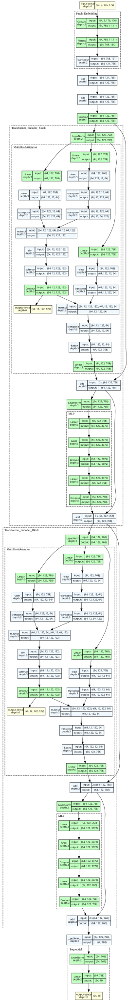

In [20]:
model_graph = draw_graph(vit, input_data = (x), device = 'cuda', expand_nested=True)
model_graph.visual_graph

In [21]:
out, at = vit(x)
out.size()

torch.Size([64, 10])

### 3. Training

In [24]:
"""Train Function"""

def Train(x: torch.Tensor, y: torch.Tensor, optimizer: torch.optim, n_step):

    torch.cuda.empty_cache()
    vit.train()
    y_pred, _ = vit(x)
    loss_criterion = nn.CrossEntropyLoss()
    loss = loss_criterion(y_pred, y)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss.item(), y_pred

In [25]:
"""Function to calculate Accuracy"""

def Accuracy(pred_labels: torch.Tensor, true_labels: torch.Tensor):

    pred_labels = torch.argmax(pred_labels, dim = -1)
    acc = sum(1 for y_pred, y in zip(pred_labels, true_labels) if y_pred == y) / len(true_labels)
    return acc

In [26]:
"""Fit Function"""

def Fit(epochs, lr):
    
    optim = torch.optim.Adam(vit.parameters(), lr = lr, betas = (0.9, 0.999), eps = 1e-9) # Initialise the optimizer.
    lr_schedule = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode = 'min', factor = 0.5, patience = 1, verbose = True)
    
    Train_Loss = []
    Train_acc = []
    for epoch in range(epochs):
        Train_Losses = []
        Train_true_labels = []
        Train_pred_labels = []
        n_step = 0

        for x, y in tqdm(Train_Dl):
            n_step += 1
            loss, y_pred = Train(x.float(), y.long(), optim, n_step)
            Train_Losses.append(torch.tensor(loss))
            Train_true_labels.extend(y)
            Train_pred_labels.extend(y_pred)
            
        train_mean_loss = torch.stack(Train_Losses).mean().item()
        Train_Loss.append(train_mean_loss)
        train_acc = Accuracy(torch.stack(Train_pred_labels), torch.stack(Train_true_labels))
        Train_acc.append(train_acc)

        lr_schedule.step(torch.stack(Train_Losses).mean())

        print("Epoch [{}], train_loss: {:.4f}, train_accuracy: {:.4f}".format(
            epoch + 1, train_mean_loss, train_acc))


    return Train_Loss, Train_acc

In [27]:
"""Kick-start of Training."""
epochs = 70
history = Fit(epochs, lr)

  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [1], train_loss: 1.8934, train_accuracy: 0.3332


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [2], train_loss: 1.5207, train_accuracy: 0.4709


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [3], train_loss: 1.3823, train_accuracy: 0.5222


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [4], train_loss: 1.2853, train_accuracy: 0.5565


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [5], train_loss: 1.2128, train_accuracy: 0.5803


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [6], train_loss: 1.1448, train_accuracy: 0.6020


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [7], train_loss: 1.0849, train_accuracy: 0.6235


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [8], train_loss: 1.0158, train_accuracy: 0.6438


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [9], train_loss: 0.9322, train_accuracy: 0.6769


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [10], train_loss: 0.8710, train_accuracy: 0.6973


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [11], train_loss: 0.7945, train_accuracy: 0.7257


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [12], train_loss: 0.7258, train_accuracy: 0.7510


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [13], train_loss: 0.6592, train_accuracy: 0.7765


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [14], train_loss: 0.5840, train_accuracy: 0.8015


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [15], train_loss: 0.5233, train_accuracy: 0.8300


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [16], train_loss: 0.4666, train_accuracy: 0.8465


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [17], train_loss: 0.4149, train_accuracy: 0.8677


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [18], train_loss: 0.3960, train_accuracy: 0.8722


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [19], train_loss: 0.3569, train_accuracy: 0.8890


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [20], train_loss: 0.3363, train_accuracy: 0.8960


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [21], train_loss: 0.3198, train_accuracy: 0.9025


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [22], train_loss: 0.2869, train_accuracy: 0.9116


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [23], train_loss: 0.2730, train_accuracy: 0.9168


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [24], train_loss: 0.2649, train_accuracy: 0.9194


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [25], train_loss: 0.2894, train_accuracy: 0.9125


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [26], train_loss: 0.2526, train_accuracy: 0.9230


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [27], train_loss: 0.2383, train_accuracy: 0.9290


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [28], train_loss: 0.2214, train_accuracy: 0.9339


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [29], train_loss: 0.2190, train_accuracy: 0.9333


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [30], train_loss: 0.2094, train_accuracy: 0.9372


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [31], train_loss: 0.2043, train_accuracy: 0.9374


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [32], train_loss: 0.2003, train_accuracy: 0.9406


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [33], train_loss: 0.1954, train_accuracy: 0.9404


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [34], train_loss: 0.1860, train_accuracy: 0.9433


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [35], train_loss: 0.1902, train_accuracy: 0.9420


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [36], train_loss: 0.1766, train_accuracy: 0.9454


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [37], train_loss: 0.1718, train_accuracy: 0.9460


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [38], train_loss: 0.1716, train_accuracy: 0.9486


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [39], train_loss: 0.1696, train_accuracy: 0.9476


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [40], train_loss: 0.1569, train_accuracy: 0.9525


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [41], train_loss: 0.1651, train_accuracy: 0.9508


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [42], train_loss: 0.1358, train_accuracy: 0.9574


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [43], train_loss: 0.1455, train_accuracy: 0.9547


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch    44: reducing learning rate of group 0 to 5.0000e-05.
Epoch [44], train_loss: 0.1427, train_accuracy: 0.9569


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [45], train_loss: 0.1082, train_accuracy: 0.9680


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [46], train_loss: 0.0822, train_accuracy: 0.9754


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [47], train_loss: 0.0682, train_accuracy: 0.9789


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [48], train_loss: 0.0693, train_accuracy: 0.9799


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch    49: reducing learning rate of group 0 to 2.5000e-05.
Epoch [49], train_loss: 0.0687, train_accuracy: 0.9796


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [50], train_loss: 0.0528, train_accuracy: 0.9843


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [51], train_loss: 0.0455, train_accuracy: 0.9864


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [52], train_loss: 0.0434, train_accuracy: 0.9878


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [53], train_loss: 0.0421, train_accuracy: 0.9879


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [54], train_loss: 0.0440, train_accuracy: 0.9869


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [55], train_loss: 0.0394, train_accuracy: 0.9883


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [56], train_loss: 0.0394, train_accuracy: 0.9892


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [57], train_loss: 0.0371, train_accuracy: 0.9886


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [58], train_loss: 0.0326, train_accuracy: 0.9904


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [59], train_loss: 0.0318, train_accuracy: 0.9911


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [60], train_loss: 0.0323, train_accuracy: 0.9911


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch    61: reducing learning rate of group 0 to 1.2500e-05.
Epoch [61], train_loss: 0.0321, train_accuracy: 0.9909


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [62], train_loss: 0.0278, train_accuracy: 0.9929


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [63], train_loss: 0.0228, train_accuracy: 0.9937


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [64], train_loss: 0.0212, train_accuracy: 0.9945


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [65], train_loss: 0.0229, train_accuracy: 0.9940


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch    66: reducing learning rate of group 0 to 6.2500e-06.
Epoch [66], train_loss: 0.0245, train_accuracy: 0.9933


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [67], train_loss: 0.0188, train_accuracy: 0.9957


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [68], train_loss: 0.0165, train_accuracy: 0.9960


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [69], train_loss: 0.0153, train_accuracy: 0.9961


  0%|          | 0/410 [00:00<?, ?it/s]

Epoch [70], train_loss: 0.0164, train_accuracy: 0.9961


In [28]:
"""Save the model checkpoints.""" 
torch.save(vit.state_dict(), 'VIT.pth')

### 4. Visualization of Loss and Accuracy

In [29]:
losses_train, acc_train = history

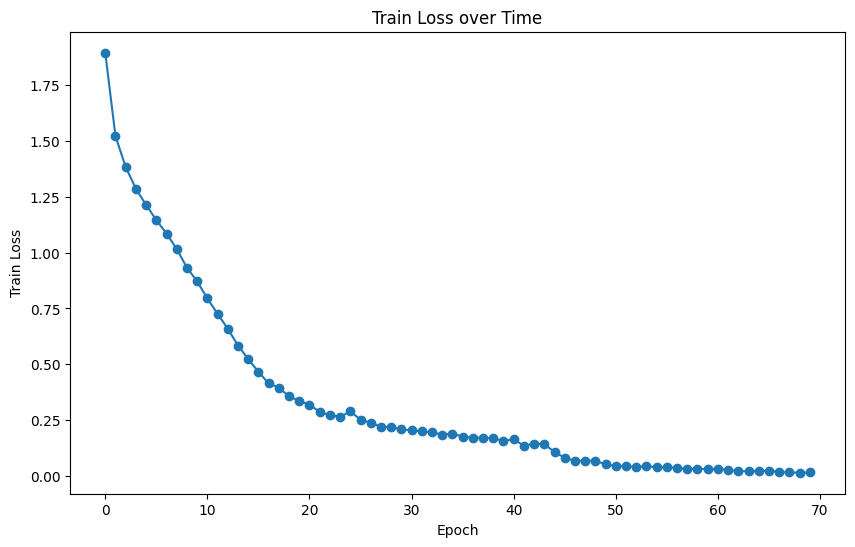

In [30]:
x = range(len(losses_train))

plt.figure(figsize=(10,6))
plt.plot(x, losses_train ,'-')
plt.scatter(x, losses_train)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')
plt.title('Train Loss over Time')
plt.show()

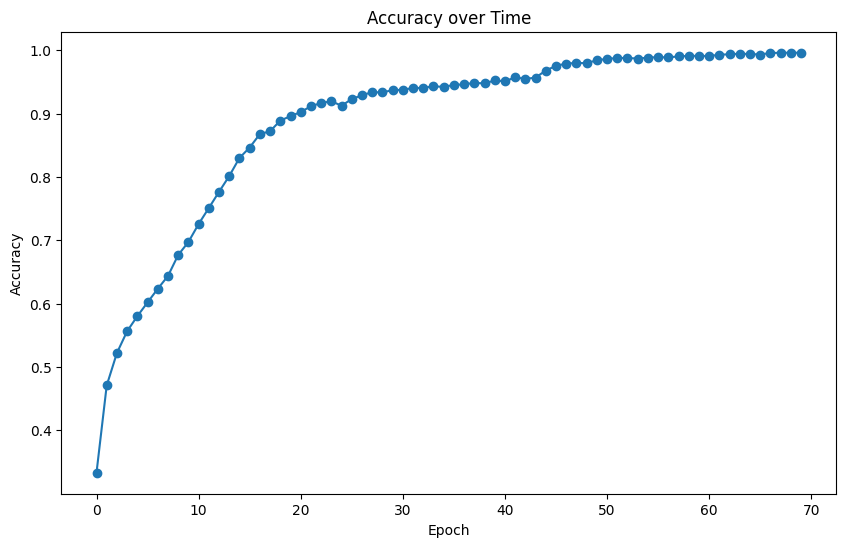

In [31]:
x = range(len(acc_train))

plt.figure(figsize=(10,6))
plt.plot(x, acc_train ,'-')
plt.scatter(x, acc_train)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Time')
plt.show()

### 5. Inference

In [42]:
def plot_attention(im, at):

    """
    Ref: https://github.com/jeonsworld/ViT-pytorch/blob/main/visualize_attention_map.ipynb
    """

    att_mat = torch.stack(at).squeeze(1).detach().cpu()
    #print(att_mat.size())

    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1)

    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    # Attention from the output token to the input space.
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    img = denorm(x).permute(1, 2, 0)
    img = torch.clamp(img, 0, 1)
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

    ax1.set_title('Original')
    ax2.set_title('Attention Map')
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)

def inference(img_file):
    im = Image.open(os.path.join(img_file))
    x = inf_transform(im)
    print(x.size())

    logits, at = vit(x.unsqueeze(0).to(device))
    y = torch.argmax(logits, dim = -1)
    y_label =  list(Dataset_train.class_to_idx.keys())[list(Dataset_train.class_to_idx.values()).index(y)]
    print("Predicted: ", y_label)
    plot_attention(im, at)


torch.Size([3, 176, 176])
Predicted:  spider


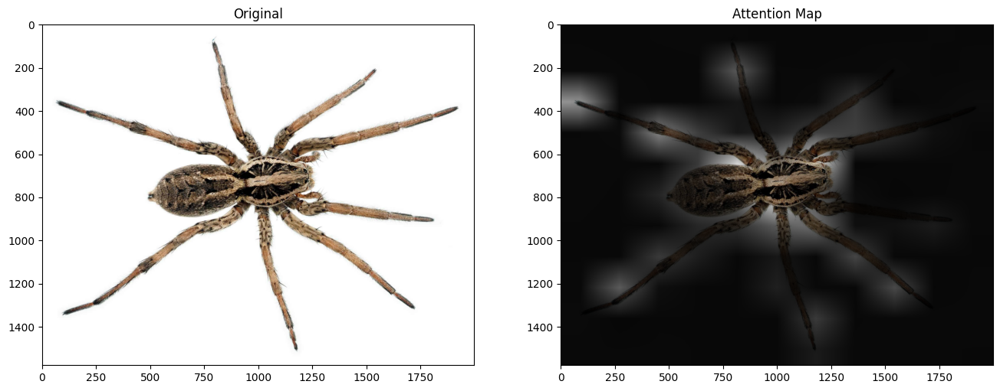

In [43]:
inference('wolf-spider.jpg')

torch.Size([3, 176, 176])
Predicted:  sheep


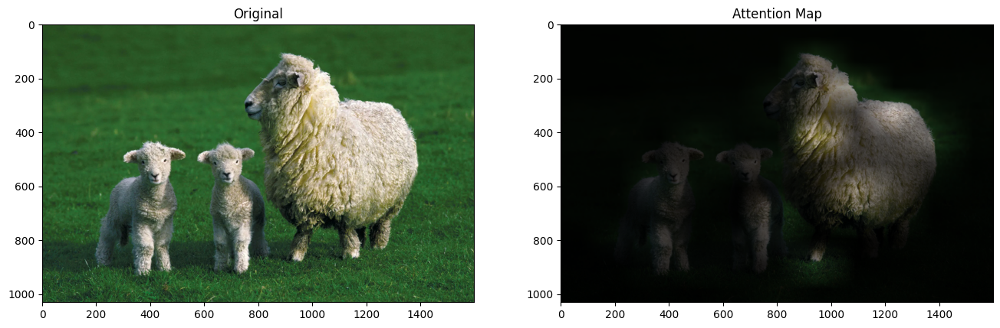

In [44]:
inference('Adult-sheep-lambs.jpg')

torch.Size([3, 176, 176])
Predicted:  butterfly


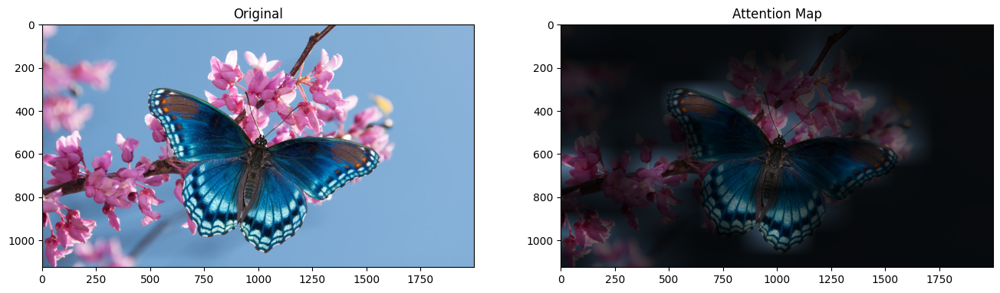

In [45]:
inference("ButterflyFamilyTree.jpg")

torch.Size([3, 176, 176])
Predicted:  dog


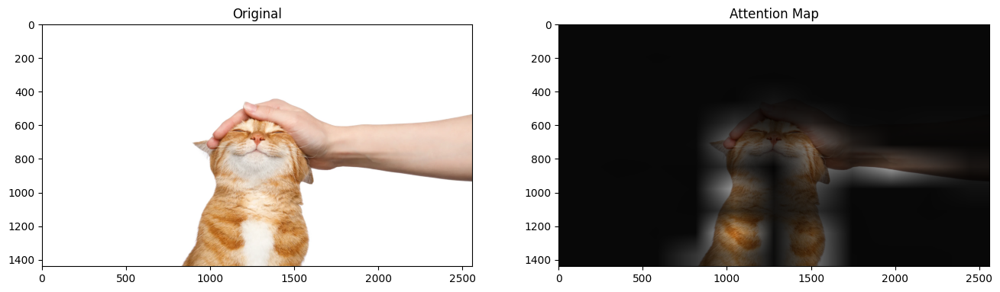

In [46]:
inference("GettyImages-1389862392.jpg")

torch.Size([3, 176, 176])
Predicted:  cat


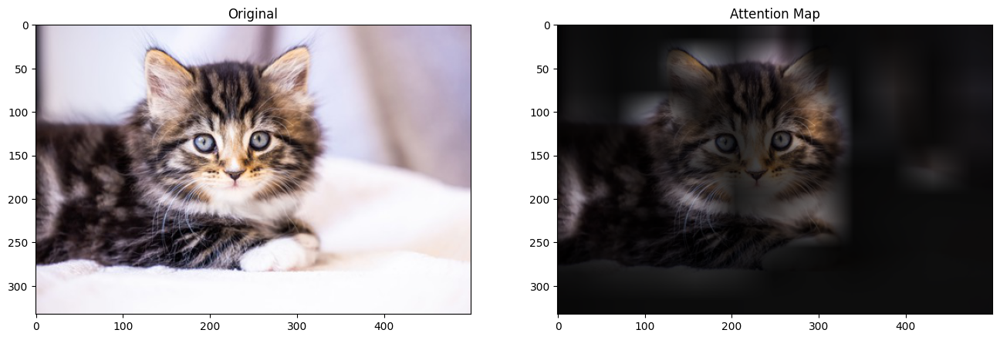

In [49]:
inference("220325case013.jpg")

torch.Size([3, 176, 176])
Predicted:  dog


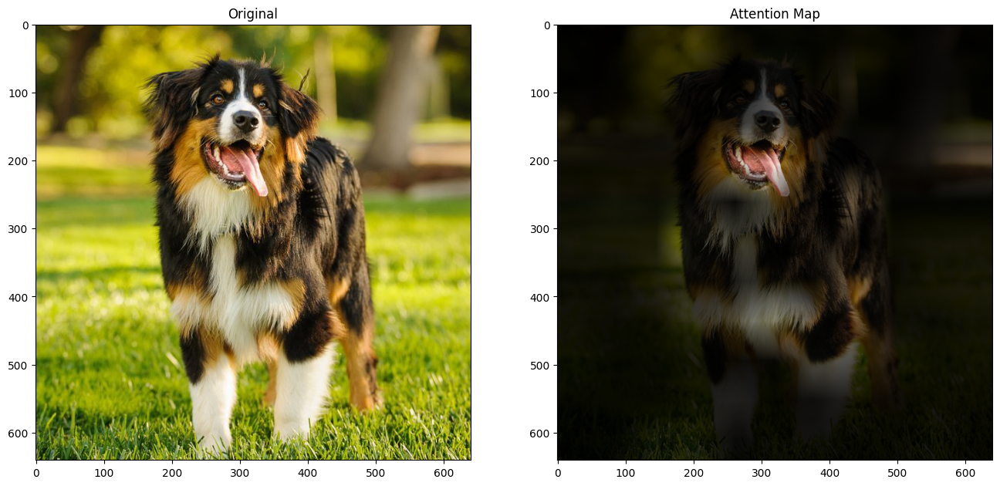

In [50]:
inference("bernese-mountain-dog.jpg")

torch.Size([3, 176, 176])
Predicted:  dog


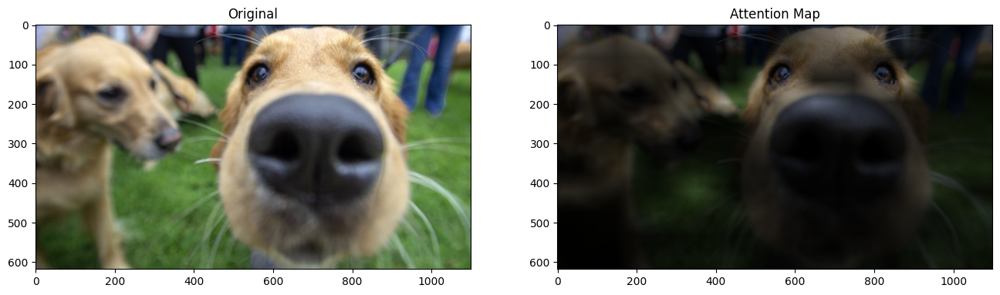

In [51]:
inference("191006152638-01-pets-and-our-health.jpg")

torch.Size([3, 176, 176])
Predicted:  elephant


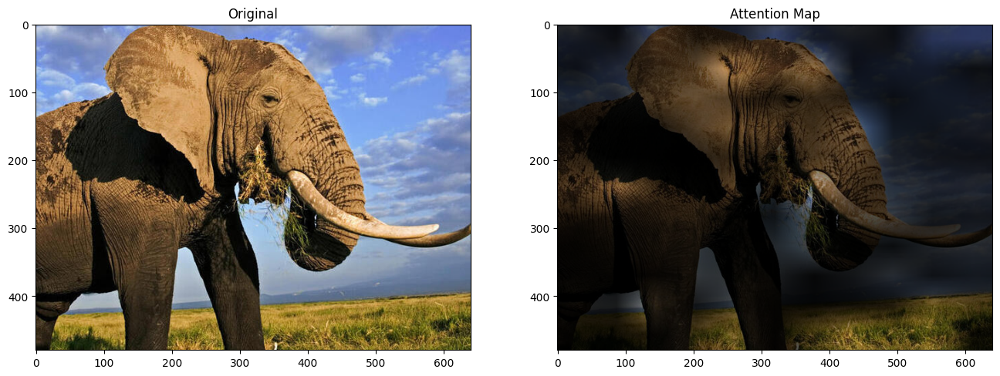

In [52]:
inference("3v49raxlb8_WW187785.jpg")

torch.Size([3, 176, 176])
Predicted:  elephant


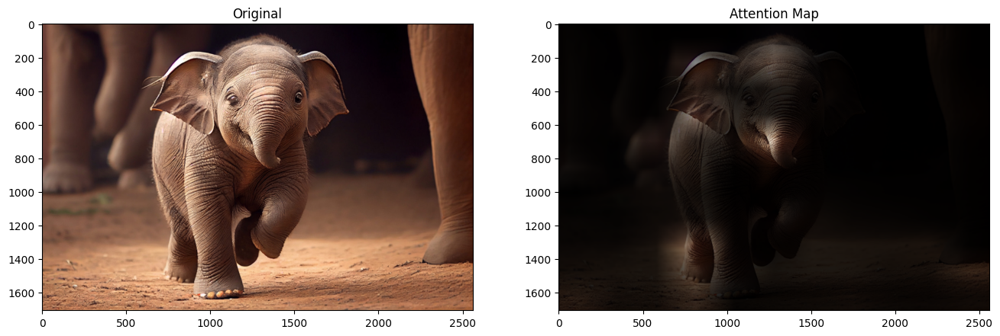

In [53]:
inference("STIM_Happy-Baby-Elephant-Running-scaled.jpeg")

torch.Size([3, 176, 176])
Predicted:  cow


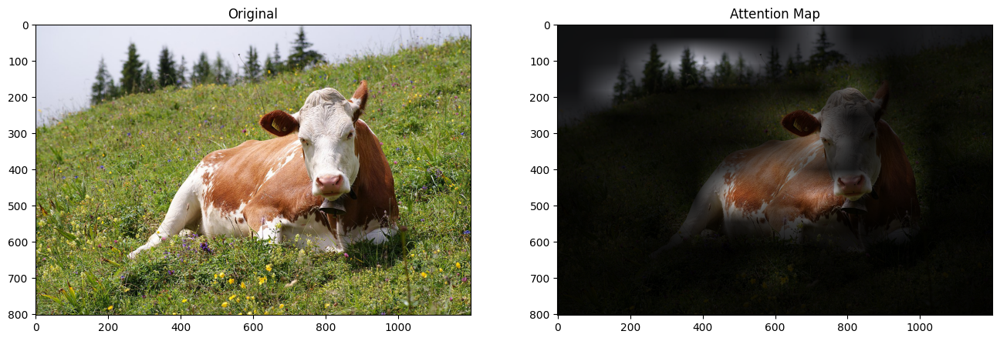

In [54]:
inference("Cow_(Fleckvieh_breed)_Oeschinensee_Slaunger_2009-07-07.jpg")

torch.Size([3, 176, 176])
Predicted:  squirrel


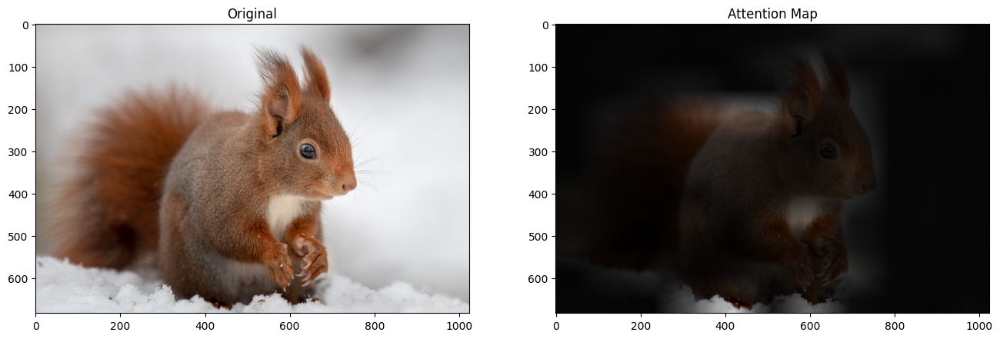

In [58]:
inference("45617890234_926bdb8cc7_b.jpg")

torch.Size([3, 176, 176])
Predicted:  squirrel


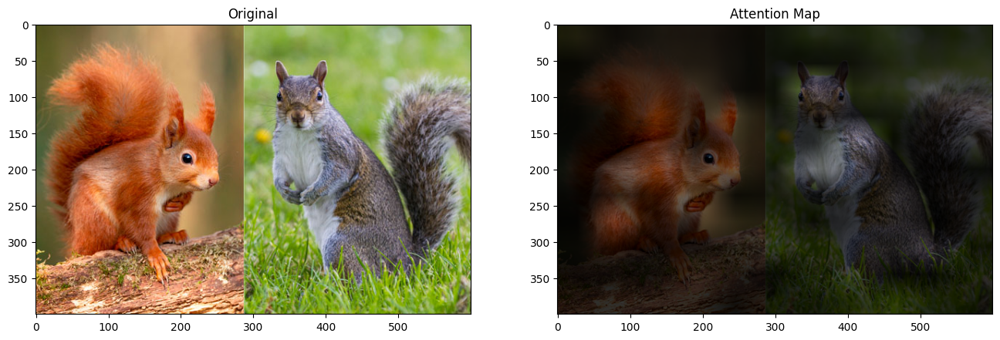

In [59]:
inference("red-squirrel-and-grey-squirrel-differences-b6e7356.jpg")

torch.Size([3, 176, 176])
Predicted:  horse


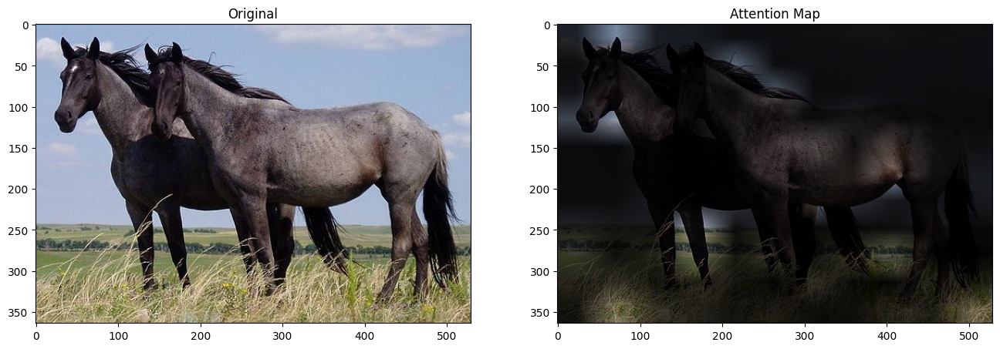

In [63]:
inference("Nokota_Horses_cropped.jpg")

### 6. References
1. [An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale](https://arxiv.org/abs/2010.11929).
2. [YouTube](https://youtu.be/Vonyoz6Yt9c?si=OgQ1oIfsJ9aq7uRO).
3. [YouTube](https://youtu.be/ovB0ddFtzzA?si=i_56yXqmPmK1vBNE).